In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

def hough(img):
  lines = cv2.HoughLinesP(
      cannyed,
      rho=6,
      theta=np.pi / 60,
      threshold=160,
      lines=np.array([]),
      minLineLength=40,
      maxLineGap=25
  )
  return lines

def paint(img, lines):
  painted = np.zeros(img.shape, dtype=np.uint8)
  for line in lines:
    for x1, y1, x2, y2 in line:
      cv2.line(painted, (x1, y1), (x2, y2), color=[0, 0, 255], thickness=3)
      
  painted = cv2.addWeighted(img, 1, painted, 1.0, 0.0)
  return painted

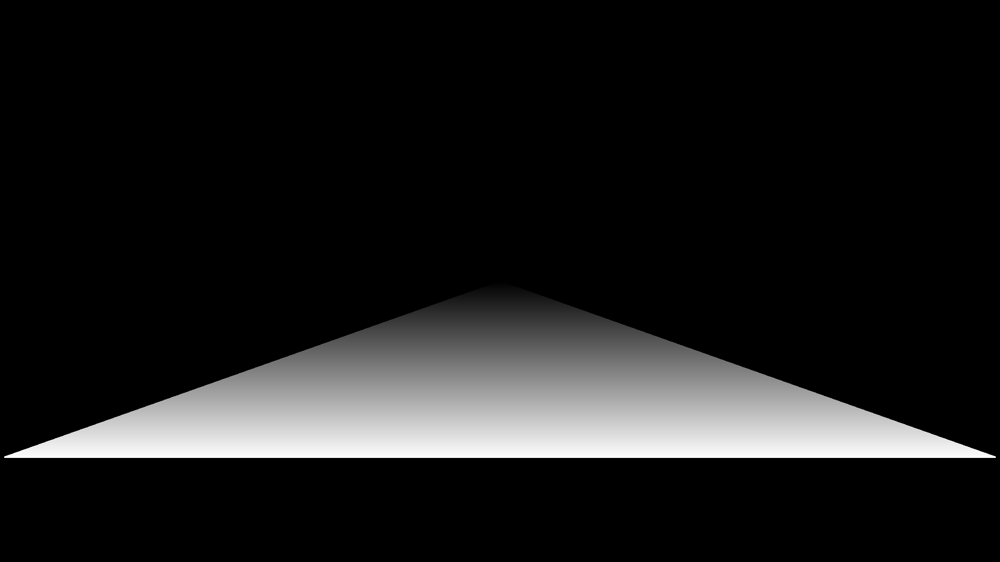

In [18]:
path = '/content/drive/My Drive/돈과 유명세를 잡자/Zumi/lane_extract/src.mp4'
src = cv2.VideoCapture(path)
ret, frame = src.read()

height, width, channel = frame.shape
interest = np.asarray([[
  (0, height-200),
  (width // 2, height // 2),
  (width, height-200),
]])

gradient = np.zeros_like(frame)
for i in range(height//2, height-200):
  gradient[i,:] = ((i - height//2) / (height//2 - 200) * 255,) * 3

mask = np.zeros_like(frame)
mask_color = (255,) * channel
cv2.fillPoly(mask, interest, mask_color)
mask = cv2.bitwise_and(gradient, mask)
mask = cv2.medianBlur(mask, 5)

cv2_imshow(mask)
pass

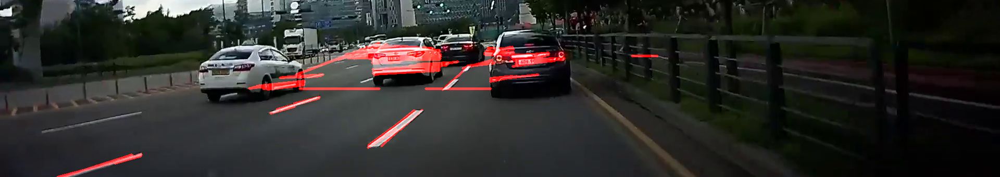

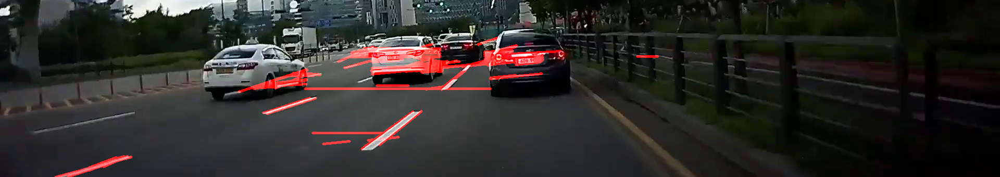

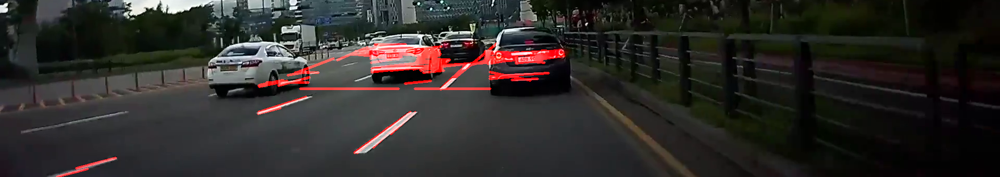

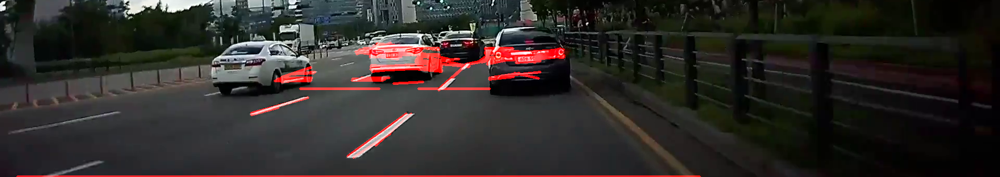

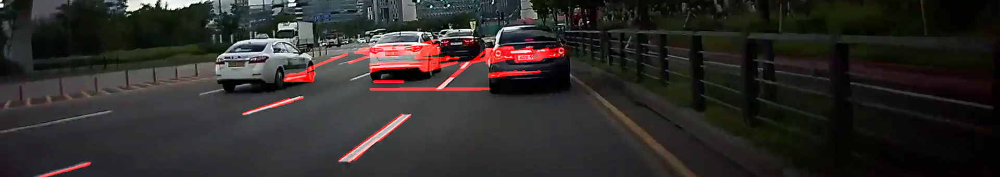

...

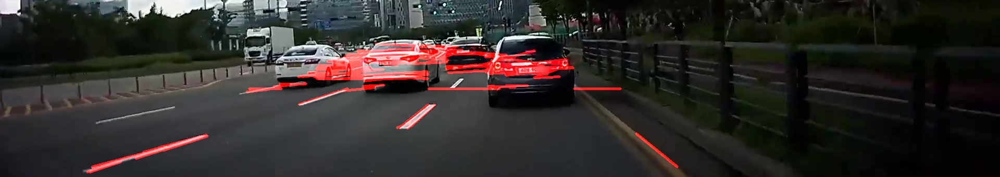

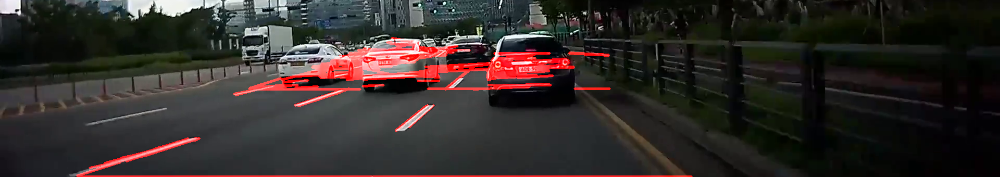

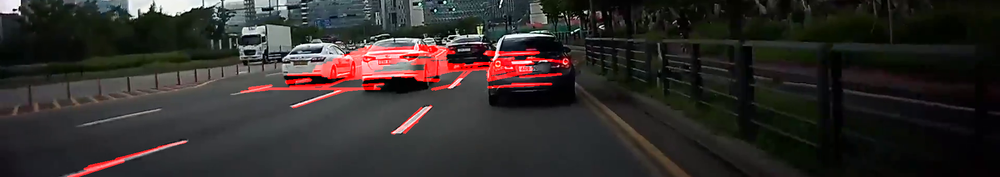

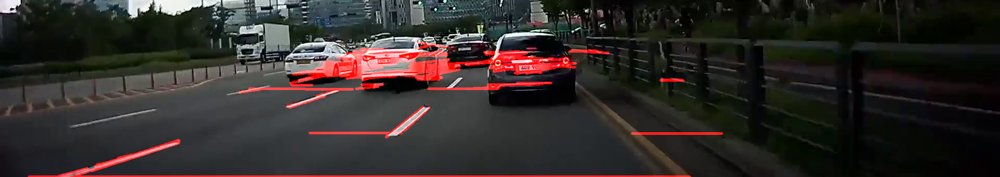

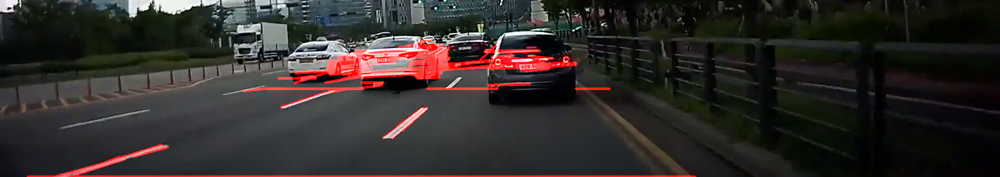

KeyboardInterrupt: ignored

In [27]:
while (src.isOpened()):
  ret, frame = src.read()
  gray= cv2.cvtColor(frame, cv2.COLOR_RGB2GRAY)
  masked = cv2.bitwise_and(gray, mask[:,:,0])
  cannyed = cv2.Canny(masked, 100, 400)

  lines = hough(cannyed)
  painted = paint(frame, lines)
  cv2_imshow(painted[height//2:height-200])